# Import Library

In [1]:
import numpy as np
import pandas as pd
import os
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from sklearn import set_config
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import recall_score
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.svm import LinearSVC
from sklearn.metrics import confusion_matrix, classification_report, make_scorer, recall_score
from sklearn.model_selection import GridSearchCV
import warnings
from pickle import dump, load

In [2]:
warnings.filterwarnings('ignore')

# Load Data

In [3]:
df = pd.read_csv("/content/drive/MyDrive/BINAR /Data Train.csv")

In [4]:
df.head(5)

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [6]:
# cek missing value

df.isna().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

In [7]:
# cek duplikat

df.duplicated().sum()

0

In [8]:
# Cek unique values dari tiap variabel

for col in df.select_dtypes(include='object').columns:
    print(f'Column: {col}')
    print(df[col].value_counts())
    print()

Column: state
WV    139
MN    108
ID    106
AL    101
VA    100
OR     99
TX     98
UT     97
NY     96
NJ     96
WY     95
OH     95
WI     94
MA     89
ME     89
CT     88
RI     87
MI     87
KS     87
MD     86
VT     86
KY     85
NV     83
IN     83
MS     82
WA     80
NC     80
MO     80
DE     80
CO     80
MT     80
IL     79
TN     79
NM     78
OK     78
NH     78
HI     77
AZ     77
FL     76
SD     75
NE     73
DC     72
SC     72
AR     71
LA     69
PA     67
ND     67
GA     64
IA     62
AK     61
CA     39
Name: state, dtype: int64

Column: area_code
area_code_415    2108
area_code_408    1086
area_code_510    1056
Name: area_code, dtype: int64

Column: international_plan
no     3854
yes     396
Name: international_plan, dtype: int64

Column: voice_mail_plan
no     3138
yes    1112
Name: voice_mail_plan, dtype: int64

Column: churn
no     3652
yes     598
Name: churn, dtype: int64



In [9]:
# Drop kolom yang tidak dipakai untuk model (state dan area code)

df = df.drop(['state', 'area_code'], axis=1)

In [10]:
df.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,107,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,137,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,84,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,75,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,121,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [11]:
df_model = df
df_model.to_csv('for_model.csv', index=False)

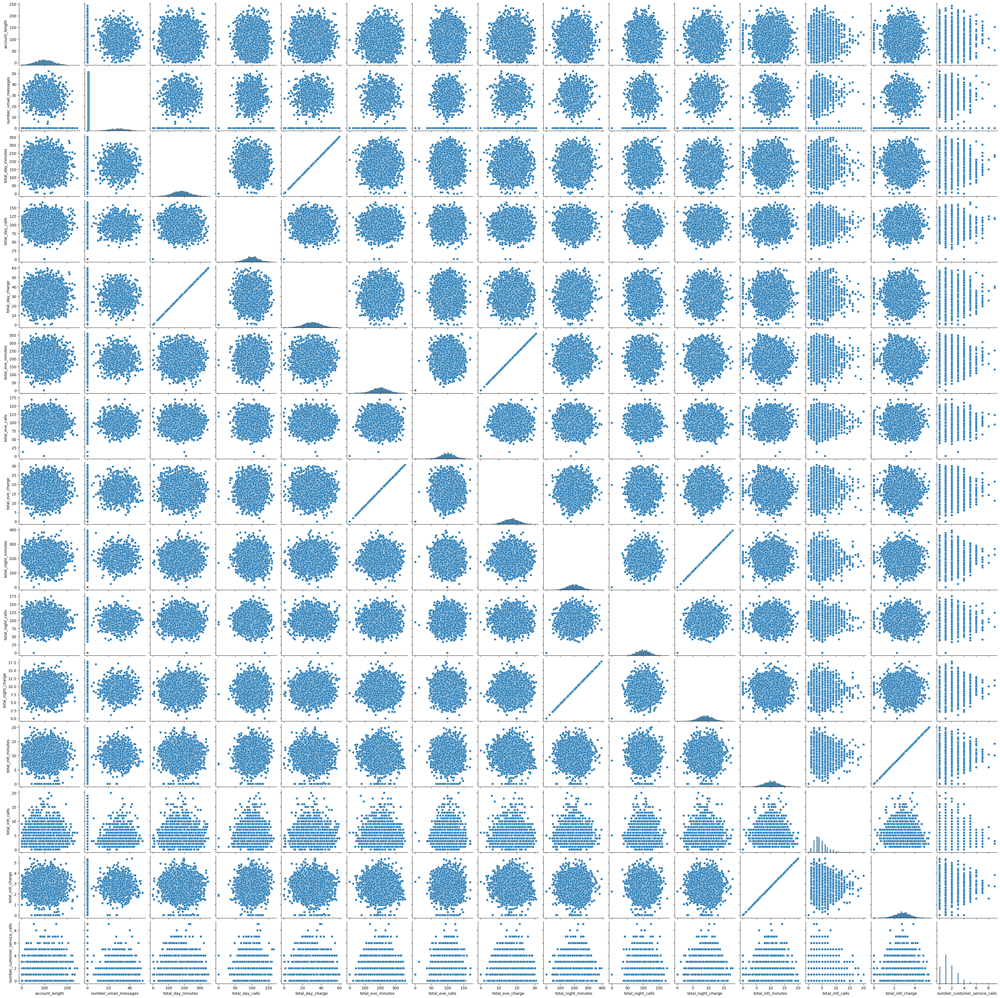

In [12]:
sns.pairplot(df_model, diag_kind = 'hist')

# Load Data for Model

In [13]:
df1 = pd.read_csv("for_model.csv")

In [14]:
df1.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,107,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,137,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,84,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,75,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,121,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


# EDA dan Data Preprocessing

In [15]:
# Ubah nilai 'yes' dengan 1 dan nilai 'no' dengan 0

df1['churn'] = df1['churn'].replace({'yes': 1, 'no': 0})
df1['international_plan'] = df1['international_plan'].replace({'yes': 1, 'no': 0})
df1['voice_mail_plan'] = df1['voice_mail_plan'].replace({'yes': 1, 'no': 0})

In [16]:
df1.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
1,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
2,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
3,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
4,121,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0


In [17]:
df1.describe()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
count,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000
mean,100.236235,0.093176,0.261647,7.631765,180.259600,99.907294,30.644682,200.173906,100.176471,17.015012,200.527882,99.839529,9.023892,10.256071,4.426353,2.769654,1.559059,0.140706
std,39.698401,0.290714,0.439583,13.439882,54.012373,19.850817,9.182096,50.249518,19.908591,4.271212,50.353548,20.093220,2.265922,2.760102,2.463069,0.745204,1.311434,0.347759
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,0.000000,0.000000,143.325000,87.000000,24.365000,165.925000,87.000000,14.102500,167.225000,86.000000,7.522500,8.500000,3.000000,2.300000,1.000000,0.000000
50%,100.000000,0.000000,0.000000,0.000000,180.450000,100.000000,30.680000,200.700000,100.000000,17.060000,200.450000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000,0.000000
75%,127.000000,0.000000,1.000000,16.000000,216.200000,113.000000,36.750000,233.775000,114.000000,19.867500,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000,0.000000
max,243.000000,1.000000,1.000000,52.000000,351.500000,165.000000,59.760000,359.300000,170.000000,30.540000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000,1.000000


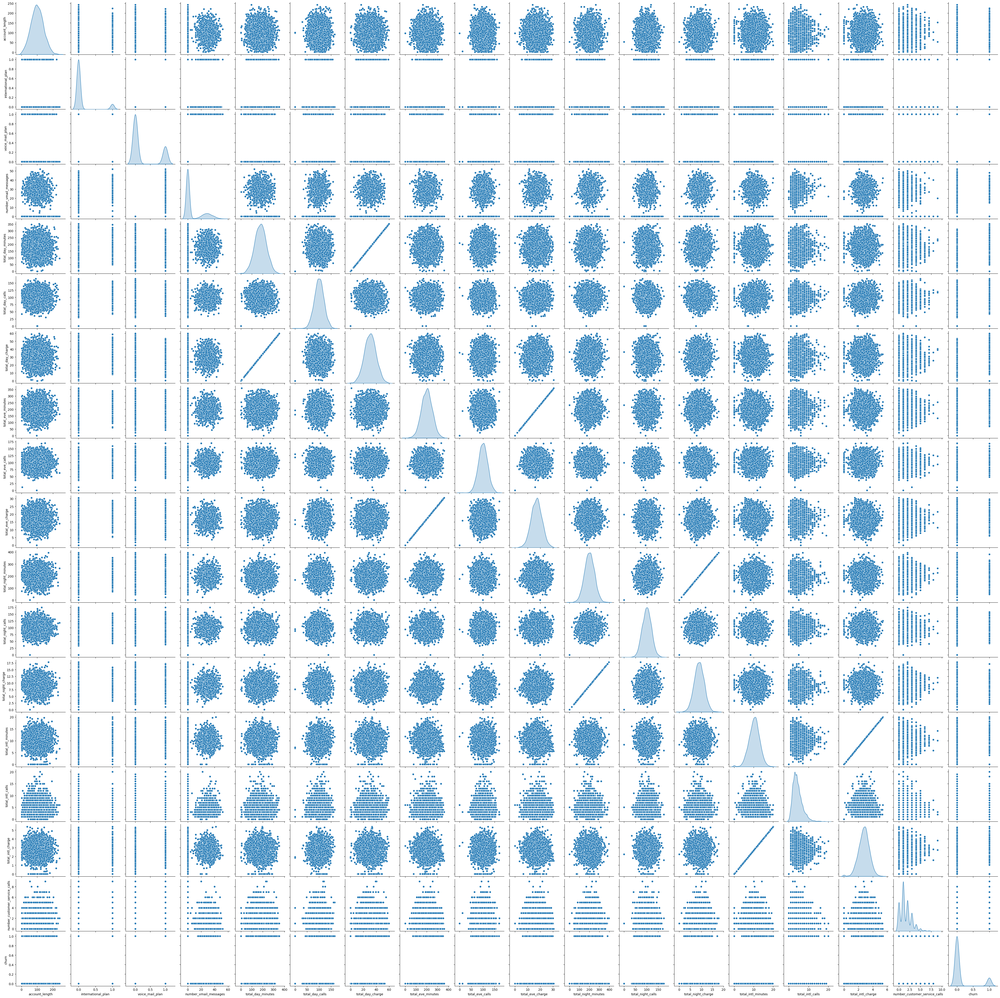

In [18]:
sns.pairplot(df1, diag_kind = 'kde')

In [19]:
# encoding

cat_cols = ['international_plan', 'voice_mail_plan', 'churn']
cat_cols

['international_plan', 'voice_mail_plan', 'churn']

In [20]:
# encoding

encoder = OneHotEncoder(handle_unknown='ignore', drop= 'first')
encoded_array = encoder.fit_transform(df[cat_cols]).toarray()
feature_names = encoder.get_feature_names_out(cat_cols)

In [21]:
df1_encode = pd.DataFrame(encoded_array, columns = feature_names).astype(int)

In [22]:
df1_encode.head()

,international_plan_yes,voice_mail_plan_yes,churn_yes
0,0,1,0
1,0,0,0
2,1,0,0
3,1,0,0
4,0,1,0


In [23]:
# join back with df

df1_clean = pd.concat([df.drop(columns = ['international_plan', 'voice_mail_plan', 'churn']), df1_encode], axis = 1)

In [24]:
df1_clean.head()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan_yes,voice_mail_plan_yes,churn_yes
0,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,1,0
1,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,0,0
2,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,1,0,0
3,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,1,0,0
4,121,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0,1,0


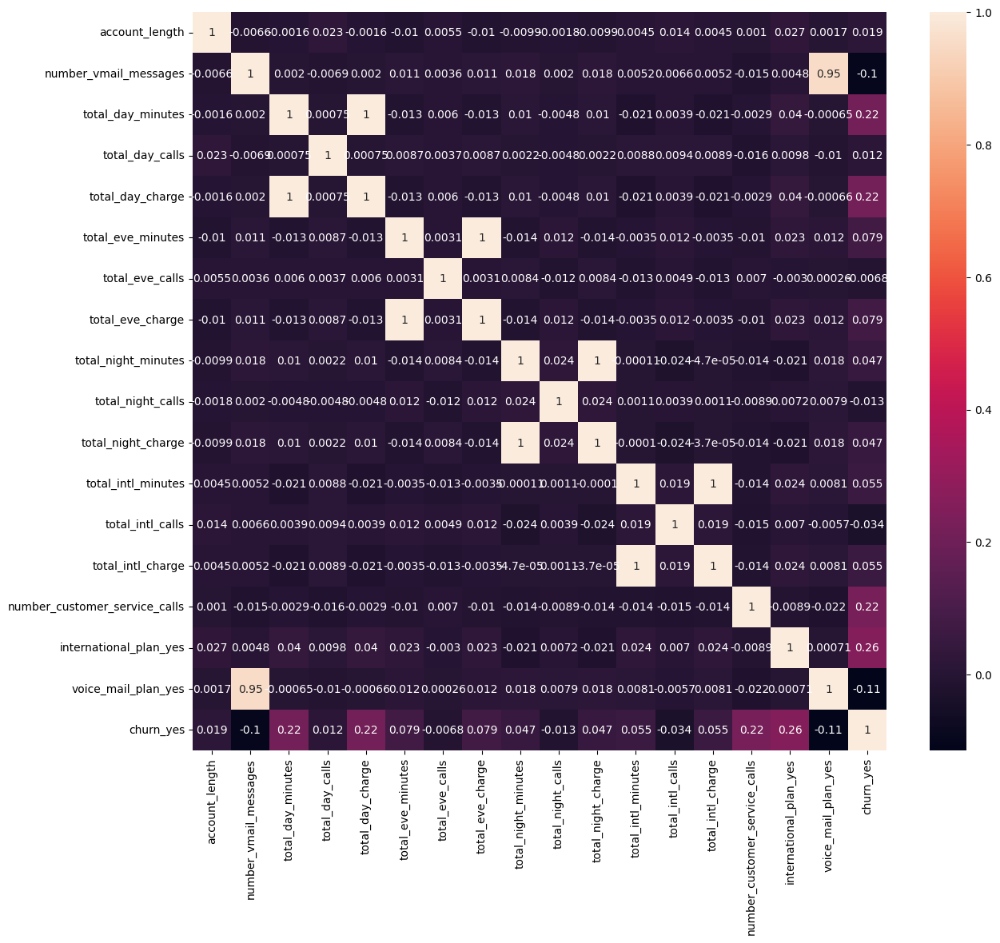

In [25]:
# Cek korelasi

plt.figure(figsize=(14, 12))
sns.heatmap(df1_clean.corr(), annot=True)
plt.show()

In [26]:
# number_vmail_messages dan voice_mail_plan_yes didrop memiliki korelasi antar variabel yang tinggi
# voice_mail_plan_yes memiliki korelasi lebih tinggi dengan churn daripada number_vmail_messages
# number_vmail_messages nantinya akan didrop dari model

df1_clean = df1_clean.drop(['number_vmail_messages'], axis=1)
df1_clean.head()

,account_length,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan_yes,voice_mail_plan_yes,churn_yes
0,107,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,1,0
1,137,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,0,0
2,84,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,1,0,0
3,75,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,1,0,0
4,121,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0,1,0


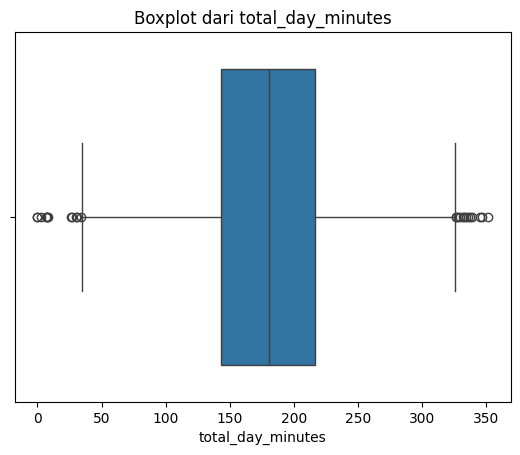

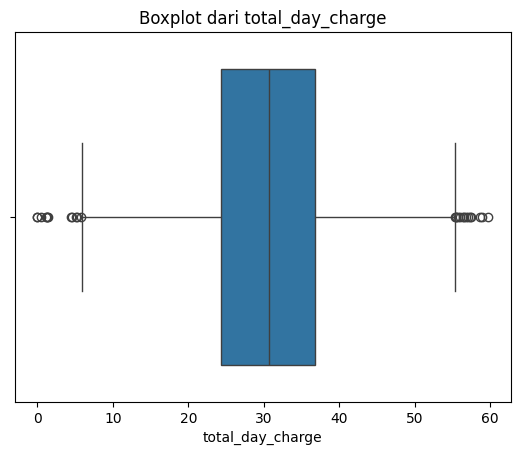

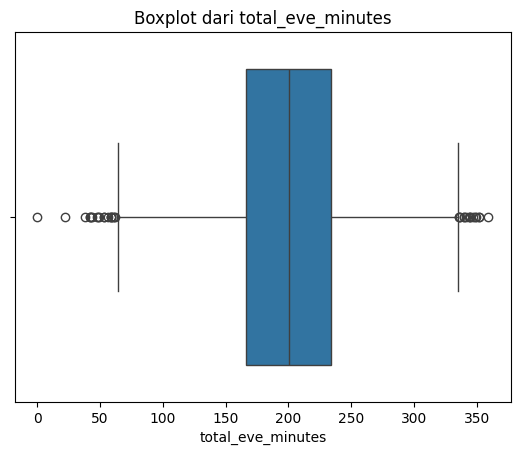

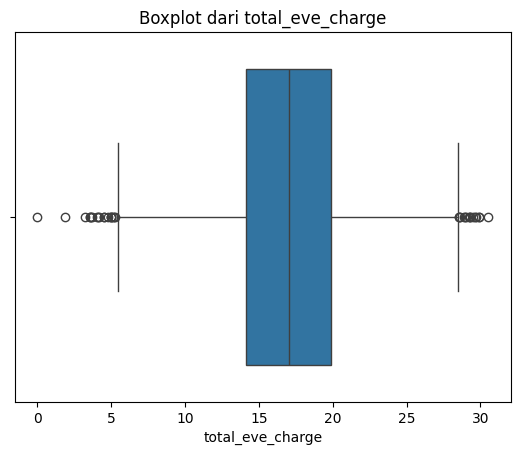

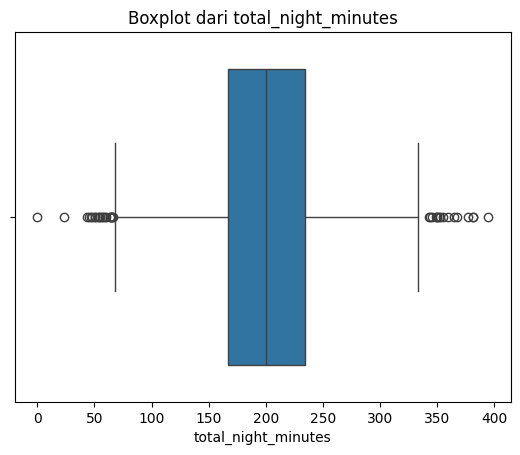

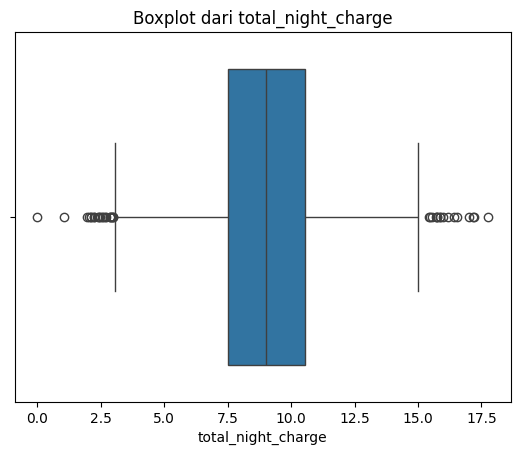

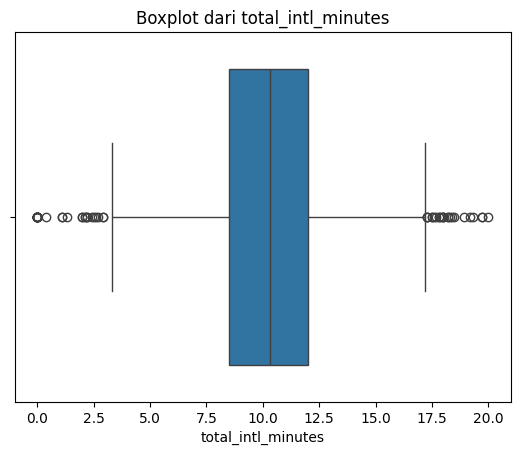

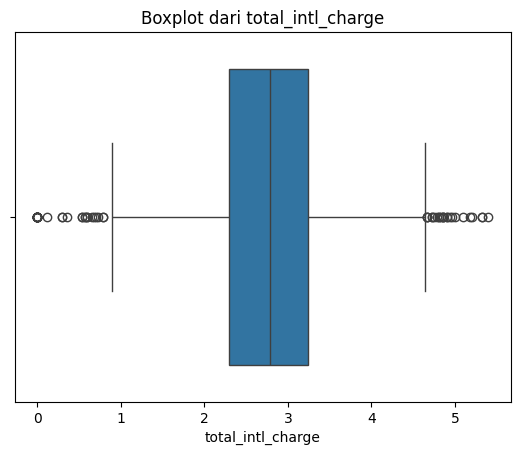

In [27]:
# Cek Outlier

float_cols = df1_clean.select_dtypes(include=['float64']).columns

for col in float_cols:
    sns.boxplot(x=df1_clean[col])
    plt.title(f'Boxplot dari {col}')
    plt.show()


Semua variabel yang dicek yaitu total_day_minutes, total_day_charge, total_eve_minutes, total_eve_charge, total_night_minutes, total_night_charge, total_intl_minutes, total_intl_charge,  memiliki extreme outlier

In [28]:
# Simpan df1_clean

df1_clean.to_csv('for_split.csv', index=False)

# Train Test Split

In [29]:
# Buat variabel X and y

df1_model = df1_clean

y = df1_model['churn_yes']
X = df1_model.drop(columns = ['churn_yes'])

In [30]:
print(type(y)); print(type(X))

<class 'pandas.core.series.Series'>
<class 'pandas.core.frame.DataFrame'>


In [31]:
# Cek jumlah data variabel X train dan test

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size = .2, random_state = 1
)

print(len(X_train))
print(len(X_test))

3400
850


In [32]:
X_train.head()

,account_length,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan_yes,voice_mail_plan_yes
3414,123,141.3,127,24.02,152.0,96,12.92,218.8,114,9.85,8.1,3,2.19,3,0,1
1926,154,64.9,76,11.03,184.1,91,15.65,151.6,75,6.82,14.6,1,3.94,1,0,1
3316,104,174.1,97,29.60,174.6,104,14.84,182.7,158,8.22,9.3,4,2.51,3,0,0
3642,126,193.1,114,32.83,75.5,61,6.42,186.2,73,8.38,11.1,1,3.00,3,0,0
3613,155,176.1,88,29.94,244.5,84,20.78,189.9,99,8.55,11.2,1,3.02,2,1,0


In [33]:
# Scaler total_day_minutes, total_day_charge, total_eve_minutes,
# total_eve_charge, total_night_minutes, total_night_charge, total_intl_minutes
# dan total_intl_charge

num_cols = ['total_day_minutes', 'total_day_charge', 'total_eve_minutes',
            'total_eve_charge', 'total_night_minutes', 'total_night_charge',
            'total_intl_minutes', 'total_intl_charge']
scaler = MinMaxScaler()
# scaler.fit(X_train[num_cols])

In [34]:
# scaled

X_train_scaled = pd.DataFrame(scaler.fit_transform(df1_model[num_cols]), columns = num_cols)
X_train[num_cols] = X_train_scaled

In [35]:
X_train.head()

,account_length,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan_yes,voice_mail_plan_yes
3414,123,0.401991,127,0.401941,0.423045,96,0.423052,0.553924,114,0.554305,0.405,3,0.405556,3,0,1
1926,154,0.184637,76,0.184572,0.512385,91,0.512443,0.383797,75,0.383793,0.730,1,0.729630,1,0,1
3316,104,0.495306,97,0.495315,0.485945,104,0.485920,0.462532,158,0.462577,0.465,4,0.464815,3,0,0
3642,126,0.549360,114,0.549364,0.210131,61,0.210216,0.471392,73,0.471581,0.555,1,0.555556,3,0,0
3613,155,0.500996,88,0.501004,0.680490,84,0.680419,0.480759,99,0.481148,0.560,1,0.559259,2,1,0


In [36]:
# Simpan hasil

dump(scaler, open('scaler.pkl', 'wb'))
df1_model.to_csv("clean_data.csv", index = False)

# Membangun Model Klasifikasi

In [37]:
models = [
    RandomForestClassifier(random_state=1),
    DecisionTreeClassifier(random_state=1),
    XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=1),
    LogisticRegression(max_iter=1000, random_state=1),
    LinearSVC(max_iter=1000, random_state=1),
    KNeighborsClassifier(),
    GaussianNB()
]

RandomForestClassifier
Confusion Matrix


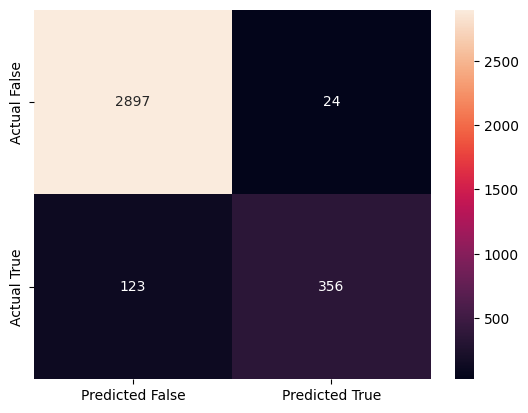

Classification Report
              precision    recall  f1-score   support

           0       0.96      0.99      0.98      2921
           1       0.94      0.74      0.83       479

    accuracy                           0.96      3400
   macro avg       0.95      0.87      0.90      3400
weighted avg       0.96      0.96      0.95      3400

DecisionTreeClassifier
Confusion Matrix


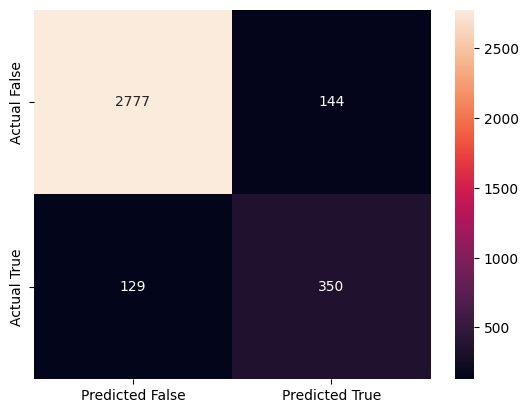

Classification Report
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      2921
           1       0.71      0.73      0.72       479

    accuracy                           0.92      3400
   macro avg       0.83      0.84      0.84      3400
weighted avg       0.92      0.92      0.92      3400

XGBClassifier
Confusion Matrix


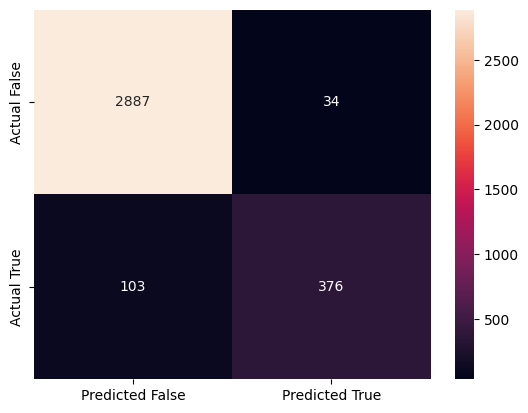

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2921
           1       0.92      0.78      0.85       479

    accuracy                           0.96      3400
   macro avg       0.94      0.89      0.91      3400
weighted avg       0.96      0.96      0.96      3400

LogisticRegression
Confusion Matrix


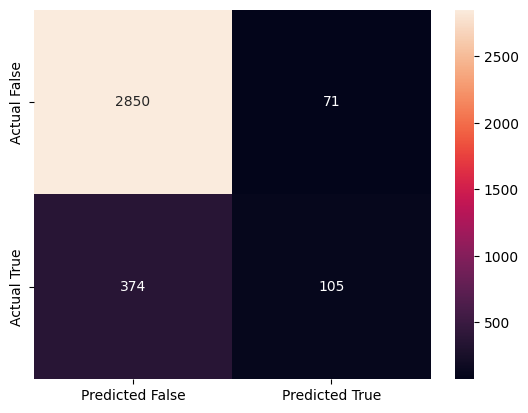

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2921
           1       0.60      0.22      0.32       479

    accuracy                           0.87      3400
   macro avg       0.74      0.60      0.62      3400
weighted avg       0.84      0.87      0.84      3400

LinearSVC
Confusion Matrix


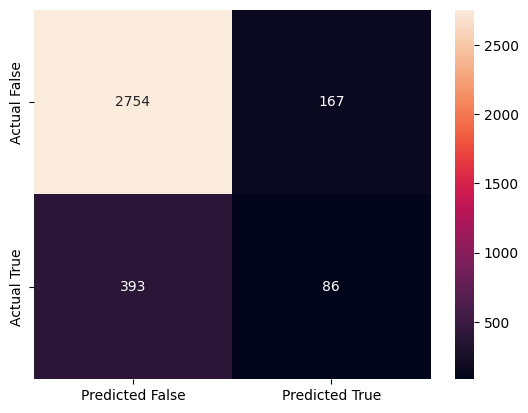

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      2921
           1       0.34      0.18      0.23       479

    accuracy                           0.84      3400
   macro avg       0.61      0.56      0.57      3400
weighted avg       0.80      0.84      0.81      3400

KNeighborsClassifier
Confusion Matrix


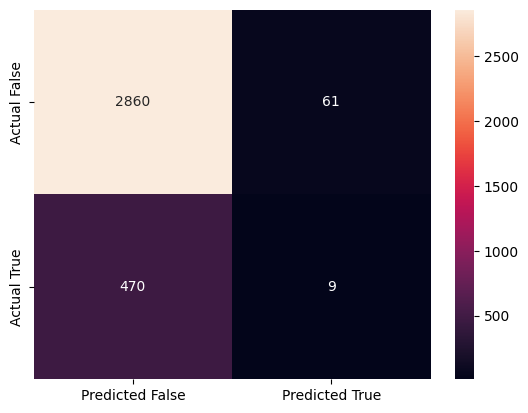

Classification Report
              precision    recall  f1-score   support

           0       0.86      0.98      0.92      2921
           1       0.13      0.02      0.03       479

    accuracy                           0.84      3400
   macro avg       0.49      0.50      0.47      3400
weighted avg       0.76      0.84      0.79      3400

GaussianNB
Confusion Matrix


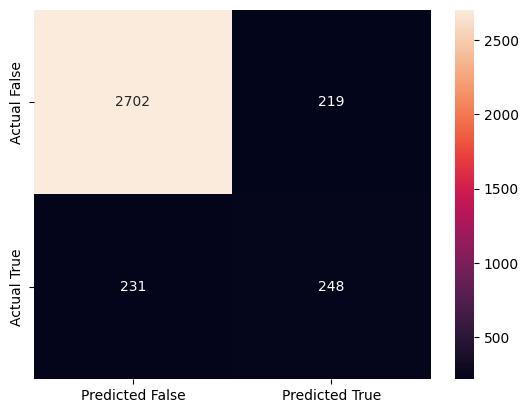

Classification Report
              precision    recall  f1-score   support

           0       0.92      0.93      0.92      2921
           1       0.53      0.52      0.52       479

    accuracy                           0.87      3400
   macro avg       0.73      0.72      0.72      3400
weighted avg       0.87      0.87      0.87      3400



In [38]:
# perform k-fold cross validation with k = 5

for clf in models:
  y_pred = cross_val_predict(clf, X_train, y_train, cv=5)
  print(type(clf).__name__)
  cm = confusion_matrix(y_train, y_pred)
  print('Confusion Matrix')
  sns.heatmap(cm, annot=True, fmt='d', xticklabels=['Predicted False', 'Predicted True'], yticklabels=['Actual False', 'Actual True'])
  plt.show()
  print('Classification Report')
  print(classification_report(y_train, y_pred))

In [51]:
# Mengambil nilai recall tiap model

# init recall
recall_scores = {}

# iterate through all models
for clf in models:
    recall = cross_val_score(clf, X_train, y_train, cv=5, scoring=make_scorer(recall_score)).mean()
    recall_scores[type(clf).__name__] = recall

In [40]:
recall_scores

{'RandomForestClassifier': 0.7433114035087719,
 'DecisionTreeClassifier': 0.7307675438596491,
 'XGBClassifier': 0.7849561403508771,
 'LogisticRegression': 0.21925438596491226,
 'LinearSVC': 0.17916666666666664,
 'KNeighborsClassifier': 0.01881578947368421,
 'GaussianNB': 0.5177631578947368}

Berdasarkan hasil diatas, Model terbaik pertama adalah XGBoost yang nilai recall terbesar. Model terbaik kedua adalah Random Forest

# Test Overfitting

In [41]:
# Cek X_test, reset the index

X_test = X_test.reset_index(drop = True)
X_test.head()

,account_length,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan_yes,voice_mail_plan_yes
0,65,224.2,106,38.11,189.6,100,16.12,222.8,75,10.03,9.8,4,2.65,0,0,1
1,82,154.0,107,26.18,94.4,114,8.02,287.6,95,12.94,10.1,7,2.73,1,0,0
2,114,206.2,79,35.05,260.0,91,22.10,291.6,83,13.12,11.4,6,3.08,1,0,1
3,38,220.5,110,37.49,180.8,114,15.37,156.5,102,7.04,5.6,7,1.51,1,0,0
4,48,198.2,108,33.69,181.0,70,15.39,238.9,86,10.75,12.1,2,3.27,1,0,0


In [42]:
# load back scaler

scaler = load(open('scaler.pkl', 'rb'))

In [43]:
scaler

MinMaxScaler()

In [44]:
# get features for scaler

scaler_features = scaler.get_feature_names_out()
scaler_features

array(['total_day_minutes', 'total_day_charge', 'total_eve_minutes',
       'total_eve_charge', 'total_night_minutes', 'total_night_charge',
       'total_intl_minutes', 'total_intl_charge'], dtype=object)

In [45]:
X_test_scaled = X_test[scaler_features]
X_test_scaled = pd.DataFrame(scaler.transform(X_test_scaled), columns = scaler_features)
X_test_scaled.head()

,total_day_minutes,total_day_charge,total_eve_minutes,total_eve_charge,total_night_minutes,total_night_charge,total_intl_minutes,total_intl_charge
0,0.637838,0.637718,0.527693,0.527832,0.564051,0.564434,0.490,0.490741
1,0.438122,0.438086,0.262733,0.262606,0.728101,0.728194,0.505,0.505556
2,0.586629,0.586513,0.723629,0.723641,0.738228,0.738323,0.570,0.570370
3,0.627312,0.627343,0.503201,0.503274,0.396203,0.396173,0.280,0.279630
4,0.563869,0.563755,0.503757,0.503929,0.604810,0.604952,0.605,0.605556


In [46]:
# Replace nilai asli dengan scaled

X_test[scaler_features] = X_test_scaled
X_test.head()

,account_length,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan_yes,voice_mail_plan_yes
0,65,0.637838,106,0.637718,0.527693,100,0.527832,0.564051,75,0.564434,0.490,4,0.490741,0,0,1
1,82,0.438122,107,0.438086,0.262733,114,0.262606,0.728101,95,0.728194,0.505,7,0.505556,1,0,0
2,114,0.586629,79,0.586513,0.723629,91,0.723641,0.738228,83,0.738323,0.570,6,0.570370,1,0,1
3,38,0.627312,110,0.627343,0.503201,114,0.503274,0.396203,102,0.396173,0.280,7,0.279630,1,0,0
4,48,0.563869,108,0.563755,0.503757,70,0.503929,0.604810,86,0.604952,0.605,2,0.605556,1,0,0


RandomForestClassifier
Confusion Matrix


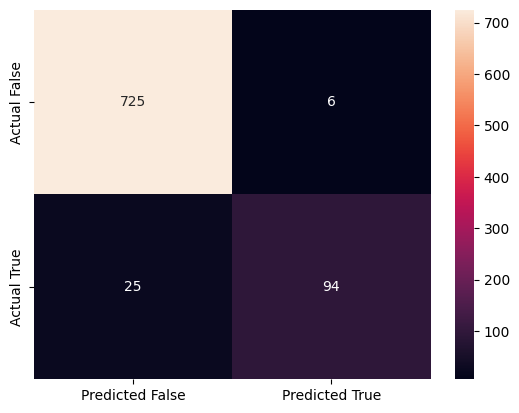

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       731
           1       0.94      0.79      0.86       119

    accuracy                           0.96       850
   macro avg       0.95      0.89      0.92       850
weighted avg       0.96      0.96      0.96       850

DecisionTreeClassifier
Confusion Matrix


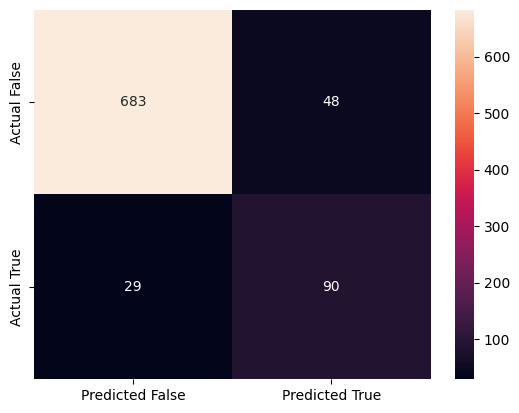

Classification Report
              precision    recall  f1-score   support

           0       0.96      0.93      0.95       731
           1       0.65      0.76      0.70       119

    accuracy                           0.91       850
   macro avg       0.81      0.85      0.82       850
weighted avg       0.92      0.91      0.91       850

XGBClassifier
Confusion Matrix


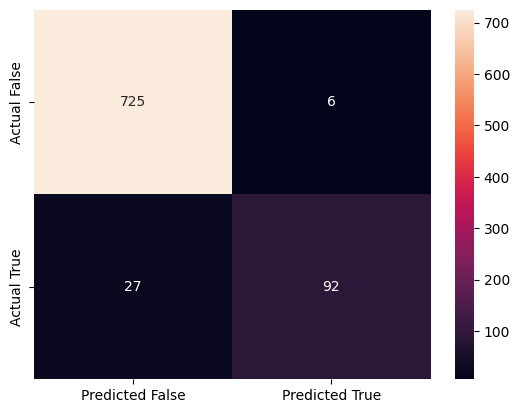

Classification Report
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       731
           1       0.94      0.77      0.85       119

    accuracy                           0.96       850
   macro avg       0.95      0.88      0.91       850
weighted avg       0.96      0.96      0.96       850

LogisticRegression
Confusion Matrix


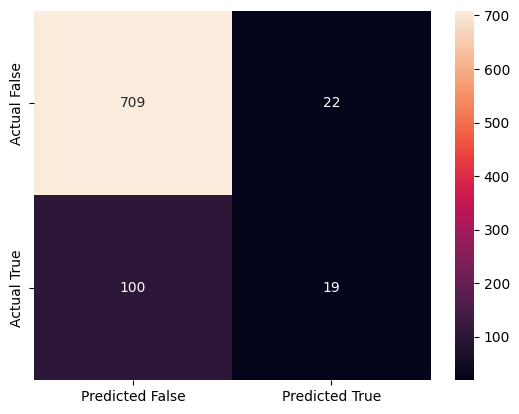

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.97      0.92       731
           1       0.46      0.16      0.24       119

    accuracy                           0.86       850
   macro avg       0.67      0.56      0.58       850
weighted avg       0.82      0.86      0.83       850

LinearSVC
Confusion Matrix


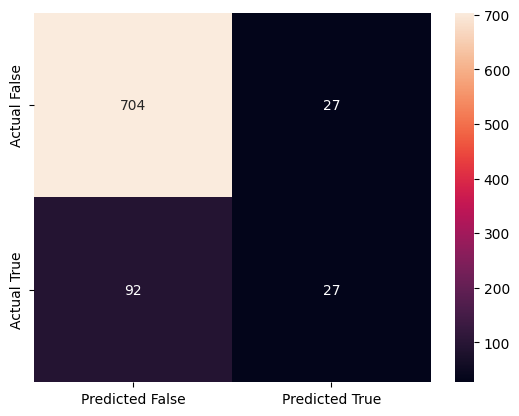

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.96      0.92       731
           1       0.50      0.23      0.31       119

    accuracy                           0.86       850
   macro avg       0.69      0.59      0.62       850
weighted avg       0.83      0.86      0.84       850

KNeighborsClassifier
Confusion Matrix


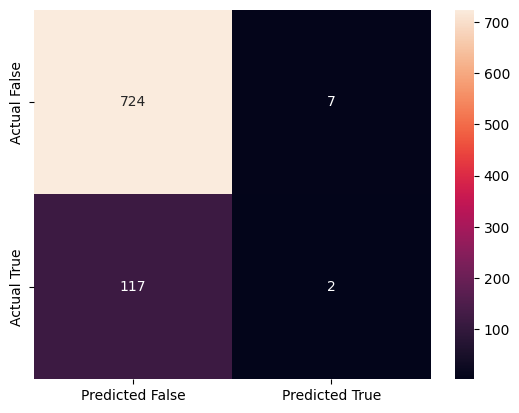

Classification Report
              precision    recall  f1-score   support

           0       0.86      0.99      0.92       731
           1       0.22      0.02      0.03       119

    accuracy                           0.85       850
   macro avg       0.54      0.50      0.48       850
weighted avg       0.77      0.85      0.80       850

GaussianNB
Confusion Matrix


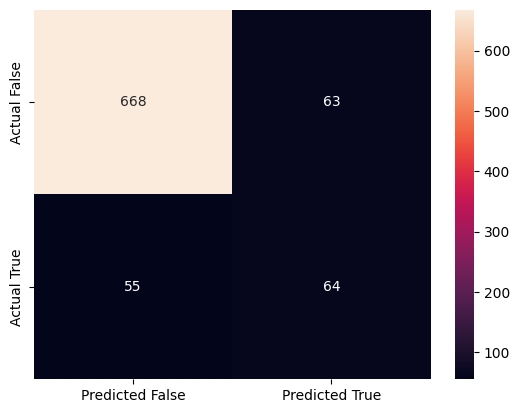

Classification Report
              precision    recall  f1-score   support

           0       0.92      0.91      0.92       731
           1       0.50      0.54      0.52       119

    accuracy                           0.86       850
   macro avg       0.71      0.73      0.72       850
weighted avg       0.87      0.86      0.86       850



In [47]:
for clf in models:
  clf.fit(X_train, y_train)
  y_pred_test = clf.predict(X_test)
  print(type(clf).__name__)
  cm2 = confusion_matrix(y_test, y_pred_test)
  print('Confusion Matrix')
  sns.heatmap(cm2, annot=True, fmt='d', xticklabels=['Predicted False', 'Predicted True'], yticklabels=['Actual False', 'Actual True'])
  plt.show()
  print('Classification Report')
  print(classification_report(y_test, y_pred_test))

In [48]:
# Mengambil nilai recall

# init recall
recall_scores_test = {}

# iterate through all models
for clf in models:
    y_pred_test = clf.predict(X_test)
    recall = recall_score(y_test, y_pred_test)
    recall_scores_test[type(clf).__name__] = recall

In [49]:
recall_scores

{'RandomForestClassifier': 0.7433114035087719,
 'DecisionTreeClassifier': 0.7307675438596491,
 'XGBClassifier': 0.7849561403508771,
 'LogisticRegression': 0.21925438596491226,
 'LinearSVC': 0.17916666666666664,
 'KNeighborsClassifier': 0.01881578947368421,
 'GaussianNB': 0.5177631578947368}

In [50]:
recall_scores_test

{'RandomForestClassifier': 0.7899159663865546,
 'DecisionTreeClassifier': 0.7563025210084033,
 'XGBClassifier': 0.773109243697479,
 'LogisticRegression': 0.15966386554621848,
 'LinearSVC': 0.226890756302521,
 'KNeighborsClassifier': 0.01680672268907563,
 'GaussianNB': 0.5378151260504201}

Berdasarkan hasil recall test:


*   Model XGBoost overfitting karena train recall > test recall
*   Model Random Forest tidak overfitting karena train recall < test recall

Sehingga model yang digunakan untuk hyperparameter tunning adalh Random Forest.

Model Random Forest selanjutnya dicari hyperparameter terbaiknya dengan hyperparameter tunning.

